In [1]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
import pandas as pd
import nltk
from nltk.tag import pos_tag
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import SnowballStemmer
from nltk.tokenize import regexp_tokenize
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
news1 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/20_2.csv")
news2 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/20_3,4.csv")
news3 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/20_5,6.csv")
news4 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/20_7,8.csv")
news5 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/20_9,10.csv")
news6 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/20_11,12.csv")
news7 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/21_1,2.csv")
news8 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/21_3,4.csv")
news9 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/21_5,6.csv")
news10 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/21_7,8.csv")
news11 = pd.read_csv("D:/Project_dataset/2nd-pr/cnn_news_2020.02-2021.10/21_9,10.csv")

In [3]:
news_main_texts = [news1['text'], news2['text'], news3['text'],news4['text'], news5['text'], news6['text'],news7['text'], news8['text'], news9['text'],news10['text'], news11['text']]
#news_main_texts[0][0]

In [4]:
# 반환값 - 문자열: 동사 -"v", 명사 - "n", 형용사 - "a", 부사-'r', 그외 -None
def get_wordnet_pos(pos_tag):
    if pos_tag.startswith('V'):
        return 'v'
    elif pos_tag.startswith('N'):
        return 'n'
    elif pos_tag.startswith('J'):
        return 'a'
    elif pos_tag.startswith('R'):
        return 'r'
    else: 
        return None

In [5]:
def tokenize_text2(text):
    # 소문자로 모두 변환
    text = text.lower() 
    # 문장 단위로 토큰화
    sentence_tokens = nltk.sent_tokenize(text) #[문장, 문장, 문장]
    

    #stopwords 조회
    stop_words = stopwords.words('english')
    stop_words.extend(['although', 'unless', 'may'])

    #원형복원을 위해 객체 생성
    lemm = WordNetLemmatizer()

    #반환한 값들을 모아 놓을 리스트
    word_token_list = []

    #문장 단위로 처리
    for sentence in sentence_tokens:
        # word 토큰 생성
        token_pattern = r'\w+'
        word_tokens = regexp_tokenize(sentence, token_pattern)
        
        #불용어들 제거
        word_tokens = [word for word in word_tokens if word not in stop_words]
        

        #Stemming
        #stemmer = SnowballStemmer('english')
        #word_tokens = [stemmer.stem(word) for word in word_tokens]
        

        #원형 복원
        #1. 품사 부착
        word_tokens = pos_tag(word_tokens)
        
        #2. lemmatize()용 품사로 변환
        word_tokens = [(word, get_wordnet_pos(tag)) for word, tag in word_tokens if get_wordnet_pos(tag)!=None]
        
        #3. 원형 복원
        word_tokens = [lemm.lemmatize(word, pos = tag) for word, tag in word_tokens]
        
        word_token_list.append(word_tokens)
        

    return word_token_list

In [6]:
news_list = []
tokened_news = []
for i in range(len(news_main_texts)):
    for j in range(len(news_main_texts[i])):
       news_list = news_main_texts[i][j]
       text_pp = tokenize_text2(news_list)
       tokened_news.append(text_pp)
print(tokened_news)

[[['business', 'biotech', 'firm', 'moderna', 'ship', 'experimental', 'coronavirus', 'vaccine', 'government', 'researcher', 'week', 'start', 'work', 'immunization'], ['initial', 'trial', 'potential', 'vaccine', 'begin', 'april', 'process', 'test', 'approval', 'last', 'least', 'year', 'moderna', 'mrna', 'say', 'statement', 'monday', 'first', 'batch', 'novel', 'coronavirus', 'vaccine', 'call', 'mrna', 'send', 'national', 'institute', 'allergy', 'infectious', 'disease', 'niaid', 'share', 'company', 'locate', 'boston', 'trading', 'high', 'new', 'york', 'tuesday', 'moderna', 'say', 'first', 'vial', 'experimental', 'vaccine', 'use', 'planned', 'phase', 'study', 'united', 'state', 'typically', 'involve', 'test', 'vaccine', 'small', 'number', 'healthy', 'human'], ['niaid', 'director', 'anthony', 'fauci', 'say', 'clinical', 'trial', 'start', 'end', 'april', 'first', 'step', 'potentially', 'make', 'vaccine', 'available', 'use', 'wall', 'street', 'journal', 'first', 'report', 'development', 'say',

In [7]:
news_tokens = tokened_news

In [8]:
news_tokens

[[['business',
   'biotech',
   'firm',
   'moderna',
   'ship',
   'experimental',
   'coronavirus',
   'vaccine',
   'government',
   'researcher',
   'week',
   'start',
   'work',
   'immunization'],
  ['initial',
   'trial',
   'potential',
   'vaccine',
   'begin',
   'april',
   'process',
   'test',
   'approval',
   'last',
   'least',
   'year',
   'moderna',
   'mrna',
   'say',
   'statement',
   'monday',
   'first',
   'batch',
   'novel',
   'coronavirus',
   'vaccine',
   'call',
   'mrna',
   'send',
   'national',
   'institute',
   'allergy',
   'infectious',
   'disease',
   'niaid',
   'share',
   'company',
   'locate',
   'boston',
   'trading',
   'high',
   'new',
   'york',
   'tuesday',
   'moderna',
   'say',
   'first',
   'vial',
   'experimental',
   'vaccine',
   'use',
   'planned',
   'phase',
   'study',
   'united',
   'state',
   'typically',
   'involve',
   'test',
   'vaccine',
   'small',
   'number',
   'healthy',
   'human'],
  ['niaid',
   'd

In [9]:
#news_tokens을 2차원 리스트로 변환
import itertools
news_tokens = list(itertools.chain.from_iterable(tokened_news))
news_tokens

[['business',
  'biotech',
  'firm',
  'moderna',
  'ship',
  'experimental',
  'coronavirus',
  'vaccine',
  'government',
  'researcher',
  'week',
  'start',
  'work',
  'immunization'],
 ['initial',
  'trial',
  'potential',
  'vaccine',
  'begin',
  'april',
  'process',
  'test',
  'approval',
  'last',
  'least',
  'year',
  'moderna',
  'mrna',
  'say',
  'statement',
  'monday',
  'first',
  'batch',
  'novel',
  'coronavirus',
  'vaccine',
  'call',
  'mrna',
  'send',
  'national',
  'institute',
  'allergy',
  'infectious',
  'disease',
  'niaid',
  'share',
  'company',
  'locate',
  'boston',
  'trading',
  'high',
  'new',
  'york',
  'tuesday',
  'moderna',
  'say',
  'first',
  'vial',
  'experimental',
  'vaccine',
  'use',
  'planned',
  'phase',
  'study',
  'united',
  'state',
  'typically',
  'involve',
  'test',
  'vaccine',
  'small',
  'number',
  'healthy',
  'human'],
 ['niaid',
  'director',
  'anthony',
  'fauci',
  'say',
  'clinical',
  'trial',
  'start

In [10]:
#news_tokens을 1차원 리스트로 변환
news_words = []
for lst in news_tokens:
    news_words = news_words+lst

from nltk import Text

#Text 객체 생성- Text객체가 하나의 문서를 분석한다. 
news_texts = Text(news_words)
news_texts

# token 속성 - Text 내의 모든 토큰들을 반환
news_texts.tokens


['business',
 'biotech',
 'firm',
 'moderna',
 'ship',
 'experimental',
 'coronavirus',
 'vaccine',
 'government',
 'researcher',
 'week',
 'start',
 'work',
 'immunization',
 'initial',
 'trial',
 'potential',
 'vaccine',
 'begin',
 'april',
 'process',
 'test',
 'approval',
 'last',
 'least',
 'year',
 'moderna',
 'mrna',
 'say',
 'statement',
 'monday',
 'first',
 'batch',
 'novel',
 'coronavirus',
 'vaccine',
 'call',
 'mrna',
 'send',
 'national',
 'institute',
 'allergy',
 'infectious',
 'disease',
 'niaid',
 'share',
 'company',
 'locate',
 'boston',
 'trading',
 'high',
 'new',
 'york',
 'tuesday',
 'moderna',
 'say',
 'first',
 'vial',
 'experimental',
 'vaccine',
 'use',
 'planned',
 'phase',
 'study',
 'united',
 'state',
 'typically',
 'involve',
 'test',
 'vaccine',
 'small',
 'number',
 'healthy',
 'human',
 'niaid',
 'director',
 'anthony',
 'fauci',
 'say',
 'clinical',
 'trial',
 'start',
 'end',
 'april',
 'first',
 'step',
 'potentially',
 'make',
 'vaccine',
 'avail

In [11]:
print(news_texts)

<Text: business biotech firm moderna ship experimental coronavirus vaccine...>


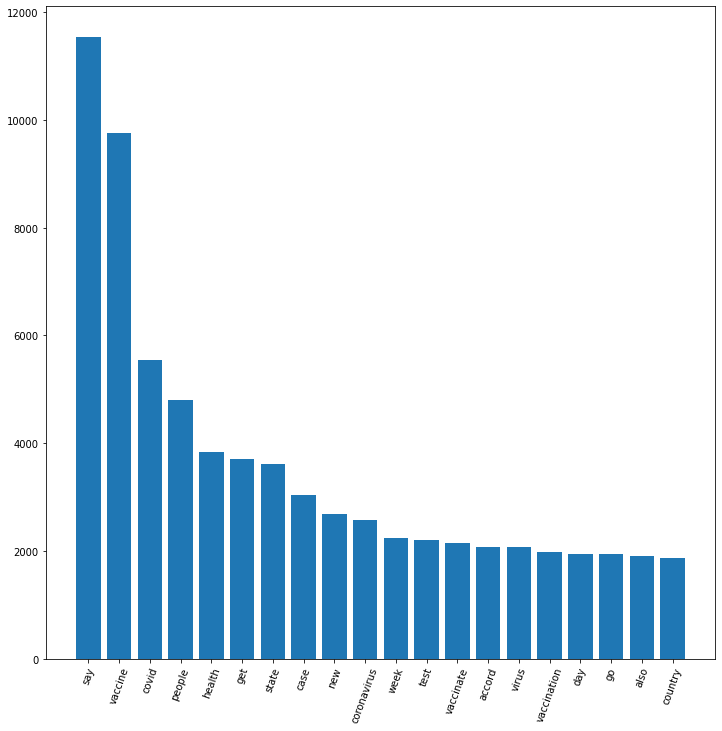

In [12]:
words_20 = pd.DataFrame(news_words).value_counts()[:20]
words_20 = pd.DataFrame(words_20, columns=['counts'])
words_20.reset_index(inplace=True)


plt.figure(figsize=(12,12))
plt.bar(words_20[0], words_20['counts'])

plt.xticks(rotation = '70')
plt.show()

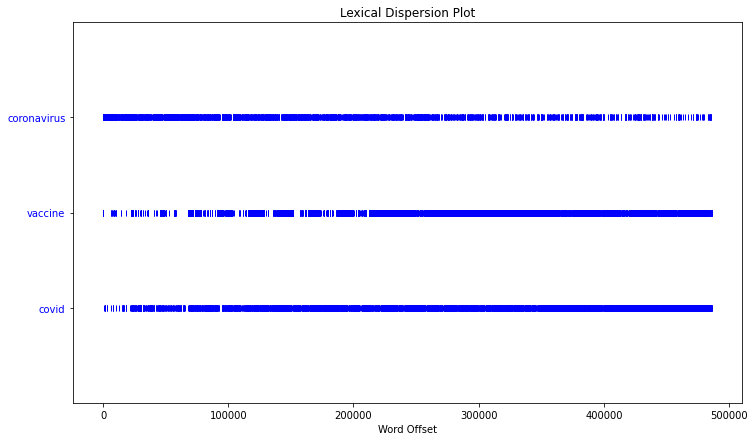

In [13]:
plt.figure(figsize=(12,7))
lst = ['coronavirus', 'vaccine', 'covid']
news_texts.dispersion_plot(lst) #전체 문서에서 리스트로 전달한 단어들이 출현한 위치를 시각화
plt.show()

In [14]:
fd = news_texts.vocab()
fd

FreqDist({'say': 11532, 'vaccine': 9751, 'covid': 5535, 'people': 4806, 'health': 3837, 'get': 3709, 'state': 3616, 'case': 3027, 'new': 2682, 'coronavirus': 2572, ...})

In [15]:
fd.B() #고유 단어의 개수

18045

In [16]:
fd.N() #총 단어의 개수

486311

In [17]:
fd.freq('coronavirus')# vaccine개수/총개수

0.005288796675378513

In [18]:
df = pd.DataFrame(fd.most_common(), columns=['단어', '빈도수'])
df

,단어,빈도수
0,say,11532
1,vaccine,9751
2,covid,5535
3,people,4806
4,health,3837
...,...,...
18040,diseasethe,1
18041,yearhealth,1
18042,faithfully,1
18043,alachua,1


In [19]:
import matplotlib.pyplot as plt 
from wordcloud import WordCloud

In [20]:
font_path = 'C:/Windows/Fonts/malgun.ttf'
wc = WordCloud(font_path = font_path,
                min_font_size = 1,
                max_font_size = 40,
                relative_scaling = 0.2,
                background_color = 'white',
                prefer_horizontal = 0.6,
                max_words = 50)
word_cloud = wc.generate_from_frequencies(fd)

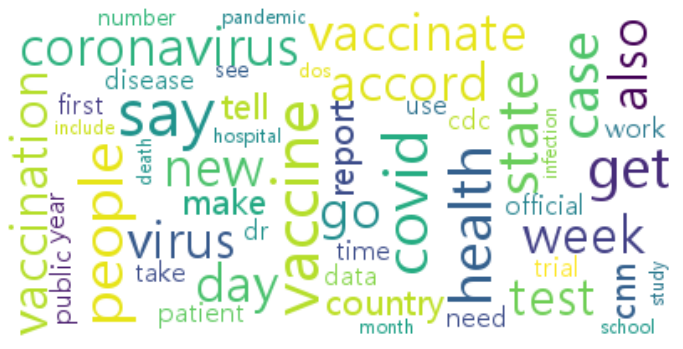

In [21]:
plt.figure(figsize=(12,7))
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()